In [1]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
from matplotlib.image import imread

In [2]:
a = np.load('PCA.npz')

In [3]:
a.files

['weights', 'avg_v', 'keigenvectors', 'faces_names']

In [4]:
faces_names = a['faces_names']
weights = a['weights']
avg_v = a['avg_v']
keigenvectors = a['keigenvectors']

In [5]:
num_people = weights.shape[0]

In [6]:
#inertia = sum of square distances in each cluster 
wcss = []
sill = []

for i in range(2, num_people):
    kmeans = KMeans(n_clusters=i, random_state=10)
    kmeans.fit(weights)
    wcss.append(kmeans.inertia_)

    labels = kmeans.labels_
    sill.append(silhouette_score(weights, labels, metric = 'euclidean'))

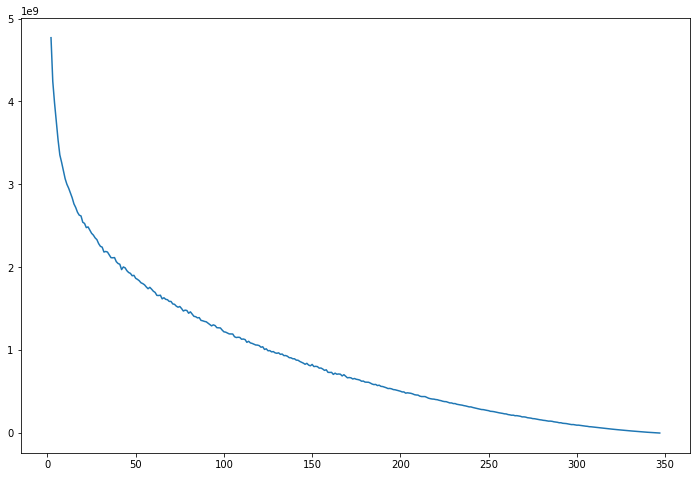

In [7]:
plt.figure(figsize=(12, 8))
plt.plot(list(range(2, num_people)), wcss)

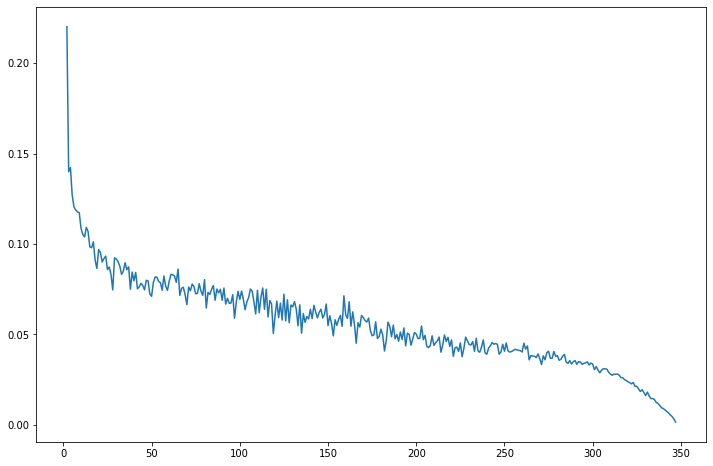

In [8]:
plt.figure(figsize=(12, 8))
plt.plot(list(range(2, num_people)), sill)

In [9]:
km = KMeans(50).fit(weights)

In [76]:
def get_groups(clusters, cluster_num, num):
    people = np.zeros(cluster_num, object)
    for p in range(clusters.shape[0]):
        cluster_num = clusters[p]
        if people[cluster_num] == 0:
            people[cluster_num] = [('faces/' + faces_names[p])]
        else:
            people[cluster_num].append('faces/' + faces_names[p])

    groups = []
    for s in people:
        if len(s) > num:
            groups.append(s)

    return groups

In [111]:
def groups_counts(groups):
    counts = dict()
    for g in groups:
        l = len(g)
        if l in counts.keys():
            counts[l] += 1
        else:
            counts[l] = 1

    print("Sum: ", sum(counts.values()))
    for key in sorted(counts):
        print(f"{key}: {counts[key]}")

def plot_grid(clusters):
    for people in clusters:
        num = len(people)
        nrows = num//6
        if num % 6 != 0:
            nrows += 1
        ncols = 6

        fig, axes = plt.subplots(figsize=(16, 3*nrows), nrows=nrows, ncols=ncols)
        axes = axes.flatten()
        for ax in axes:
            ax.set_axis_off()

        for img, ax in zip(people, axes):
            ax.imshow(imread(img), cmap="gray")

In [108]:
groups = get_groups(km.labels_, km.cluster_centers_.shape[0], 5)

In [112]:
groups_counts(groups)

Sum:  32
6: 6
7: 5
8: 5
9: 7
10: 2
11: 2
12: 1
13: 1
14: 3


C:\Users\hrech\AppData\Local\Temp\ipykernel_10052\2884947214.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(figsize=(16, 3*nrows), nrows=nrows, ncols=ncols)


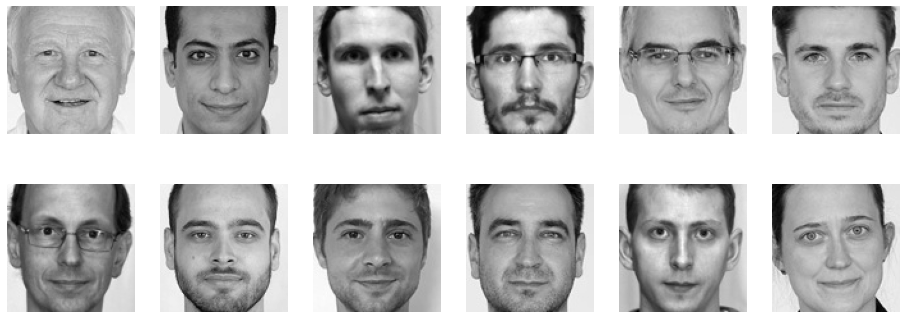

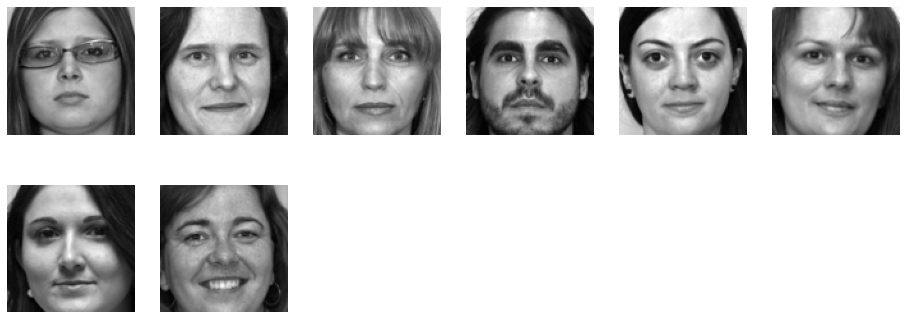

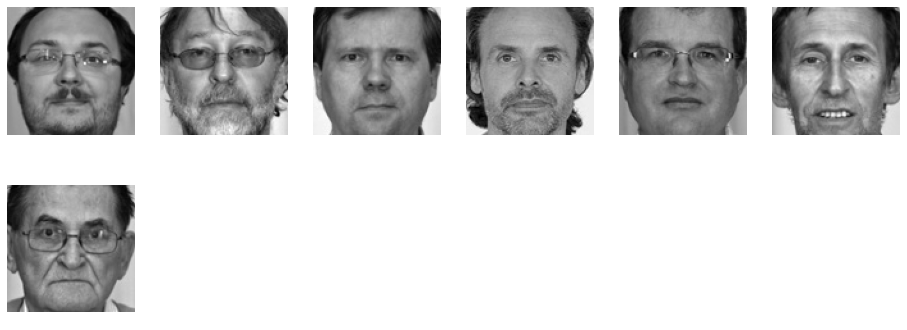

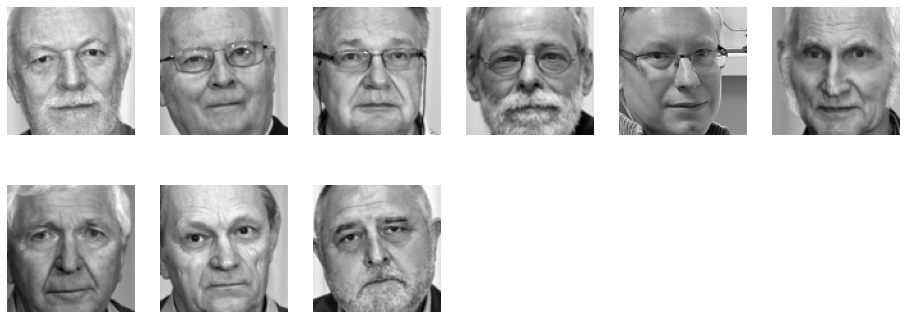

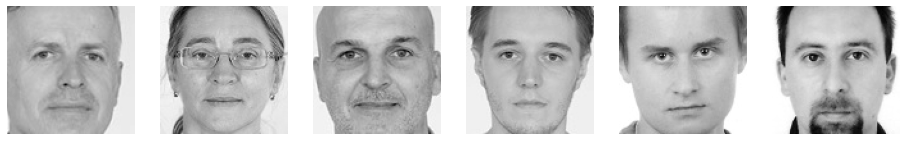

...

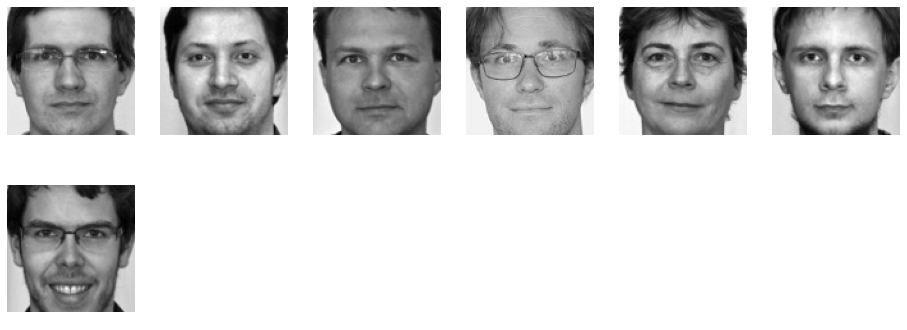

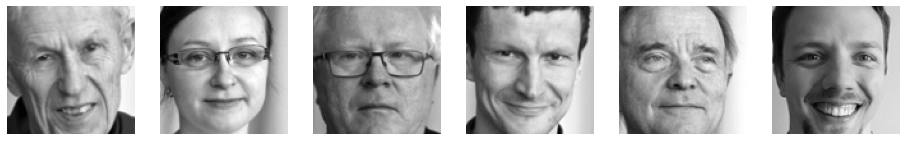

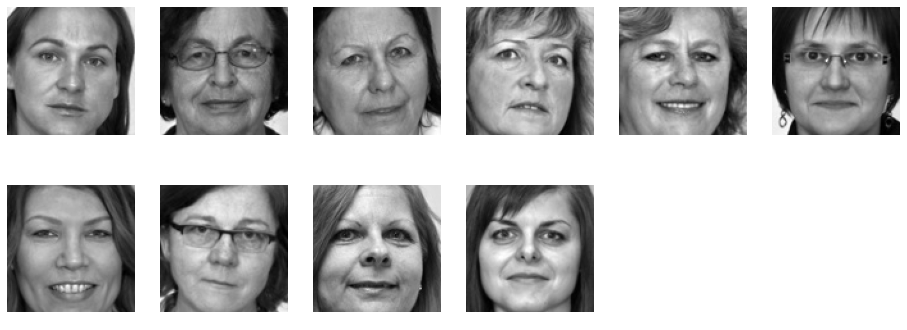

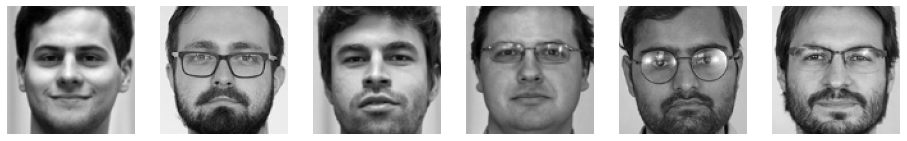

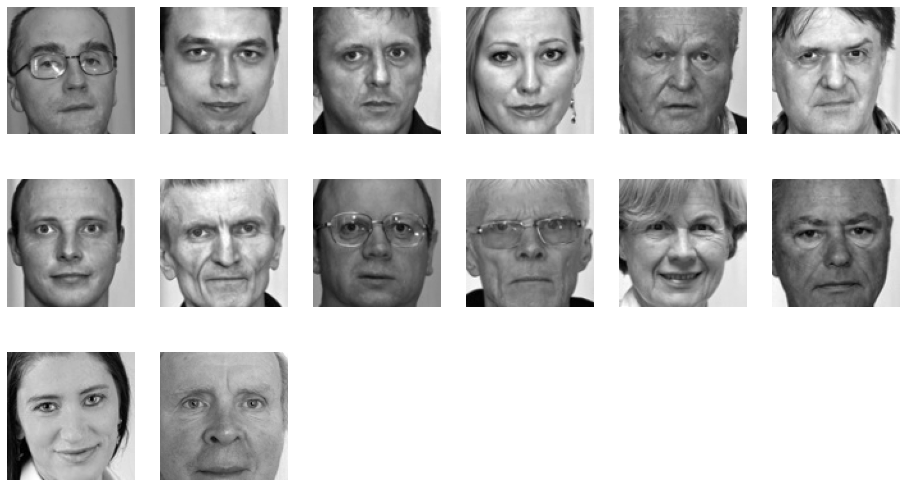

In [113]:
plot_grid(groups)

In [121]:
af = AffinityPropagation().fit(weights)

In [122]:
num_of_clusters = af.cluster_centers_indices_.shape[0]
num_of_clusters

28

In [123]:
aff_groups = get_groups(af.labels_, num_of_clusters, 5)

In [124]:
groups_counts(aff_groups)

Sum:  23
7: 2
8: 1
9: 1
10: 1
11: 2
12: 2
14: 2
15: 2
16: 2
17: 4
19: 1
20: 1
24: 1
25: 1


C:\Users\hrech\AppData\Local\Temp\ipykernel_10052\2884947214.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(figsize=(16, 3*nrows), nrows=nrows, ncols=ncols)


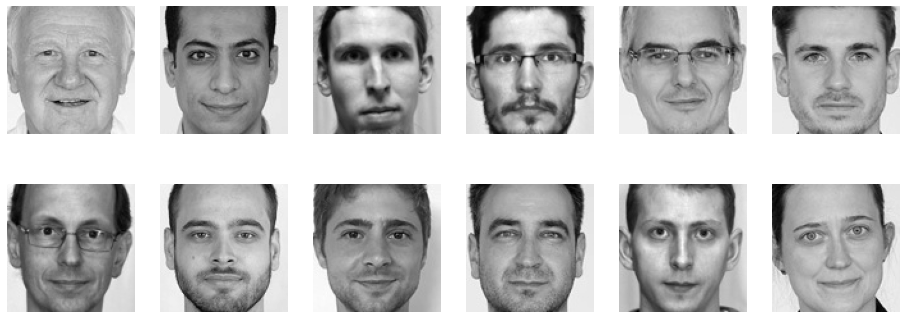

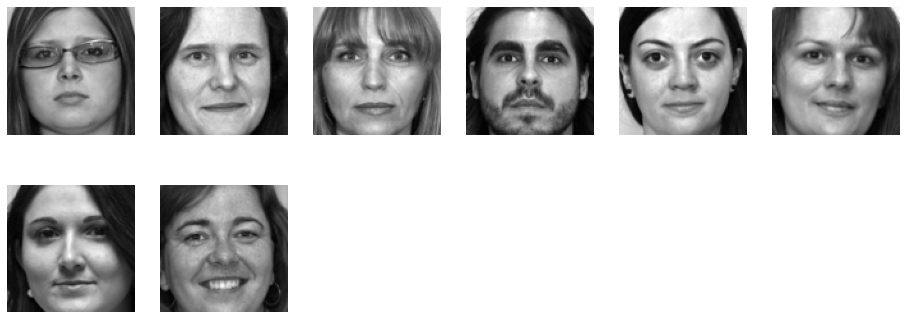

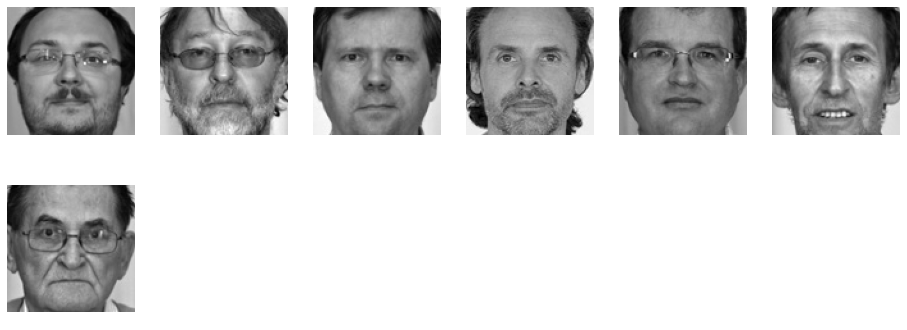

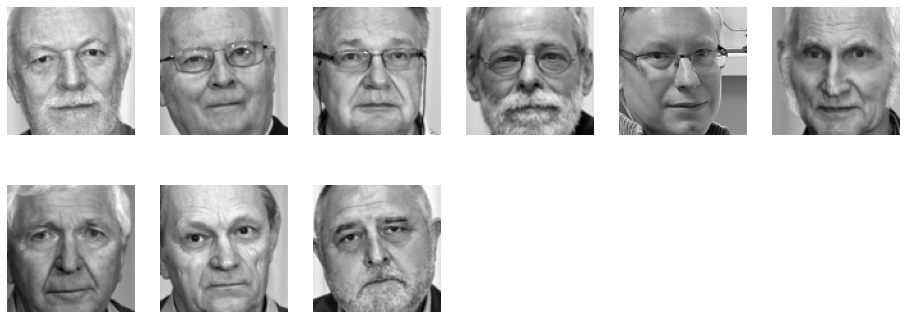

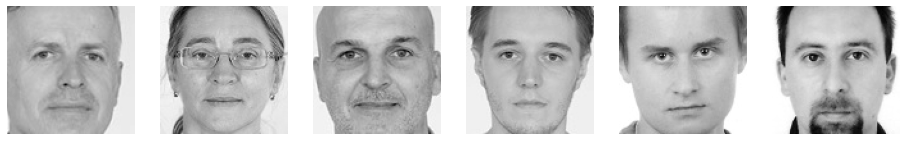

...

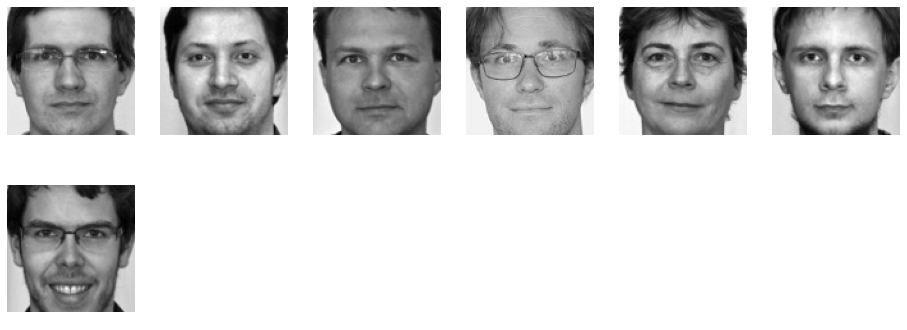

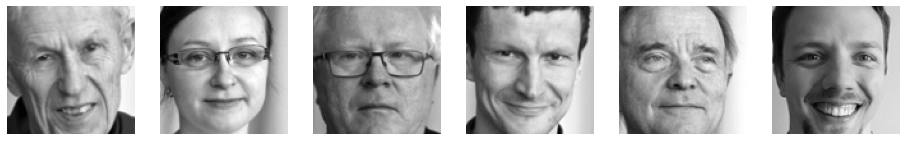

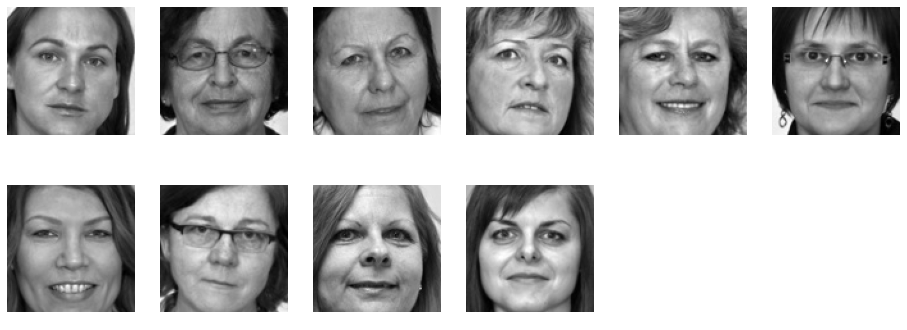

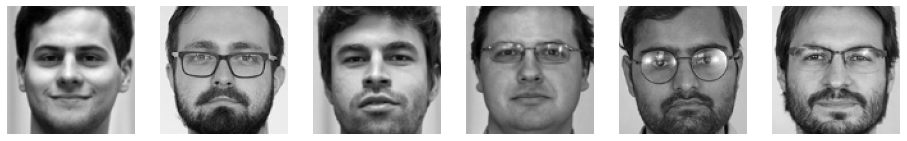

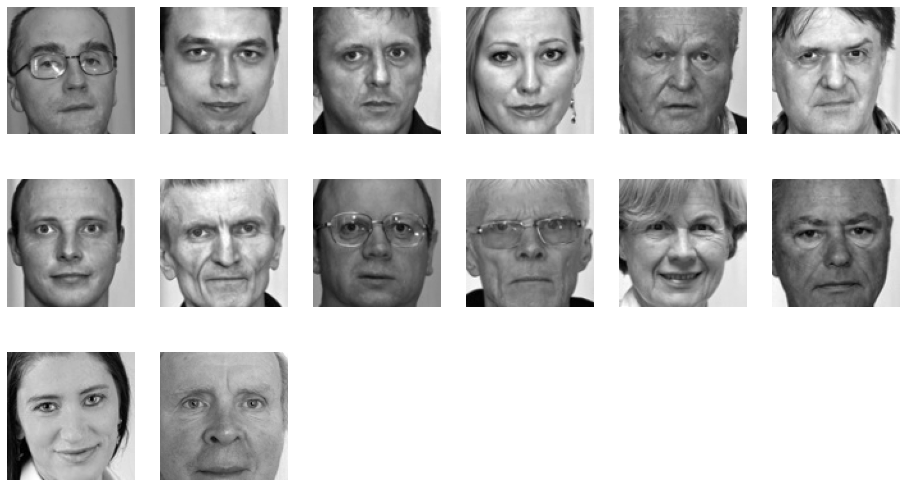

In [125]:
plot_grid(groups)